In [ ]:
import numpy   as np
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns
import plotly.express as px
import datetime
import warnings
warnings.filterwarnings("ignore")

### Pour la première partie j'étudie les catastrophe naturelle en me focalisant sur le nombre d'occurence par région et en fonction des réactions l'on pourrait avoir une idée sur l'impact. L'objectif est de prendre chaque région et ètre capable de dire que pour une année x donné il y'a eu telle nombre de catastrophe et en fonction de la réactivité cela a été bien géré donc pas d'impact potentiel sur les entreprise. Juste un point de vue partielle en attendant d'étudier les autres series.
### dans ce sens je conserve uniquement:
    --- les codes régions
    --- le nombre de cat
    --- le nombre de plan de prévention/anticipation/approuve
    ---l'année d'ocurrence

In [ ]:
data_Catastrophe = pd.read_excel(r"catastrophes_naturelles .xlsx")

In [ ]:
#etude des catastrophe naturelle
data_Catastrophe.head(2)

,codgeo,LIBCOM,GFP Fiscalité,Type de groupement Fiscalité,Code DEP,Libellé Département,Code Région,Libellé Région,Code Postal,PoPCommunes2022,typ_catnat,nb_catnat,annees,ppr_prescrit,ppr_approuve,ppr_anticip
0,097101,LES ABYMES,CA CAP Excellence,CA,971,GUADELOUPE,1,GUADELOUPE,97139,54858,inondations,1,2017,0,0,0
1,097101,LES ABYMES,CA CAP Excellence,CA,971,GUADELOUPE,1,GUADELOUPE,97139,54858,mouvements de terrains,1,2004,0,0,0


In [ ]:
data_Catastrophe.columns

Index(['codgeo', 'LIBCOM', 'GFP Fiscalité', 'Type de groupement Fiscalité',
       'Code DEP', 'Libellé Département', 'Code Région', 'Libellé Région',
       'Code Postal', 'PoPCommunes2022', 'typ_catnat', 'nb_catnat', 'annees',
       'ppr_prescrit', 'ppr_approuve', 'ppr_anticip'],
      dtype='object')

In [26]:
Colone_d_interet_data_catastrophe = ["Code Région", "annees", "nb_catnat", "ppr_prescrit", "ppr_approuve", "ppr_anticip"]
data_Catastrophe_restraint_sorted_by_year = data_Catastrophe[Colone_d_interet_data_catastrophe].sort_values(by ="annees", ascending =True)
data_Catastrophe_restraint_sorted_by_year_after_2016 = data_Catastrophe_restraint_sorted_by_year[data_Catastrophe_restraint_sorted_by_year.annees>2016]

In [27]:
data_Catastrophe_restraint_sorted_by_year_after_2016["annees"]=data_Catastrophe_restraint_sorted_by_year_after_2016["annees"].astype(str)
data_Catastrophe_restraint_sorted_by_year_after_2016["annees"] = pd.to_datetime(data_Catastrophe_restraint_sorted_by_year_after_2016["annees"])
#data_Catastrophe_restraint.set_index("annees", inplace = True)
data_Catastrophe_restraint_sorted_by_year_after_2016.head(3)

,Code Région,annees,nb_catnat,ppr_prescrit,ppr_approuve,ppr_anticip
0,1,2017-01-01,1,0,0,0
88791,75,2017-01-01,1,0,0,0
79553,75,2017-01-01,1,0,0,0


In [29]:
#groupebyregion
data_Catastrophe_restraint_sorted_by_year_after_2016_by_Region = data_Catastrophe_restraint_sorted_by_year_after_2016.groupby("Code Région").sum()	

In [33]:
data_Catastrophe_restraint_sorted_by_year_after_2016_by_Region.head(2)

,Code Région,nb_catnat,ppr_prescrit,ppr_approuve,ppr_anticip
0,1,60,480,480,0
1,2,59,504,442,0


In [37]:
data_Catastrophe_restraint_sorted_by_year_after_2016_by_Region.describe()

,Code Région,nb_catnat,ppr_prescrit,ppr_approuve,ppr_anticip
count,16.00000,16.000000,16.000000,16.000000,16.000000
mean,43.25000,1152.500000,3046.687500,2640.750000,99.000000
std,33.27161,1120.758017,3497.805326,3095.412983,131.865083
min,1.00000,3.000000,33.000000,30.000000,0.000000
25%,19.00000,145.500000,498.000000,470.500000,5.250000
50%,38.00000,831.000000,2212.500000,1691.500000,49.500000
75%,75.25000,2250.500000,4192.500000,3308.250000,125.500000
max,94.00000,3185.000000,13867.000000,12285.000000,435.000000


In [32]:
data_Catastrophe_restraint_sorted_by_year_after_2016_by_Region.reset_index(inplace =True)

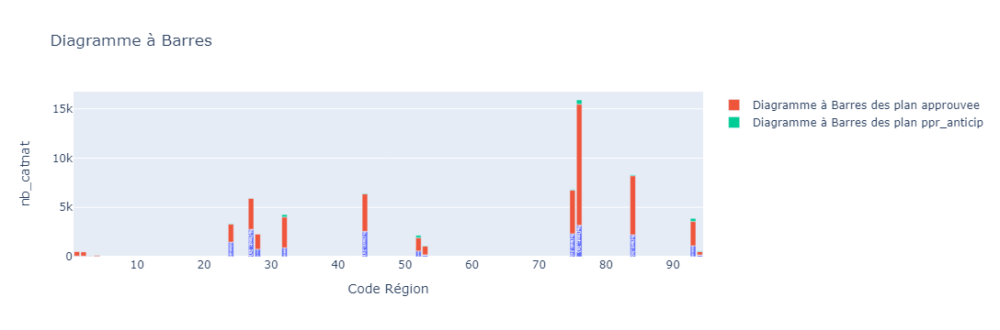

In [38]:
#durant la période de 2017-2021 l'on peut dire que l'on a eu tel nombre de catastroph par région
fig = px.bar(data_Catastrophe_restraint_sorted_by_year_after_2016_by_Region, x="Code Région", y='nb_catnat', title="Diagramme à Barres")
fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
fig.add_bar(x=data_Catastrophe_restraint_sorted_by_year_after_2016_by_Region['Code Région'], y=data_Catastrophe_restraint_sorted_by_year_after_2016_by_Region['ppr_approuve'], name='Diagramme à Barres des plan approuvee')
fig.add_bar(x=data_Catastrophe_restraint_sorted_by_year_after_2016_by_Region['Code Région'], y=data_Catastrophe_restraint_sorted_by_year_after_2016_by_Region['ppr_anticip'], name='Diagramme à Barres des plan ppr_anticip')
fig.show()

de cette figure l'on peut dire que sur ces différentes année chaque catastrophe naturelle etait accompagné d'un fort plan de résolution parfois de très haute amplitudes. Cependant que peut on en déduire de l'éffet sur l'économie?

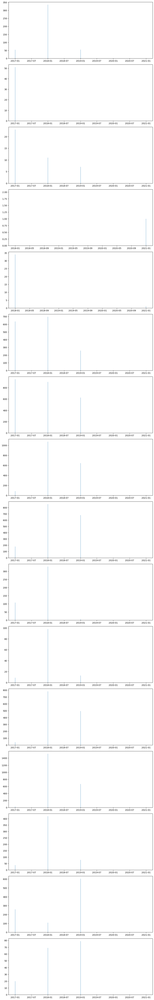

In [93]:
#affiche par année avant de passé à l'étude de l'économie
liste =  set(data_Catastrophe_restraint_sorted_by_year_after_2016["Code Région"])
num_subplots = len(liste)  # Change this number as needed
fig, axs = plt.subplots(num_subplots, 1, figsize=(10, 4*num_subplots))
for i, j in enumerate(liste):
    data = data_Catastrophe_restraint_sorted_by_year_after_2016[data_Catastrophe_restraint_sorted_by_year_after_2016["Code Région"] == j]
    data_group_By_Région = data.groupby("annees").sum()
    data_group_By_Région.reset_index(inplace = True)
    axs[i].bar(data_group_By_Région["annees"], data_group_By_Région["nb_catnat"], label=f'Subplot{j}')


plt.tight_layout()
plt.show()

In [ ]:
#Fonction de traitement des trimestres
def TraitementTrim(trim):
    trimesttre = int(str(trim)[0])*12/4
    annee=str(trim)[1:]
    trime_datetime=datetime.datetime(int(annee),int(trimesttre),1)
    return trime_datetime

Etude des données macroéconomique

In [177]:
Donnee_macroeconomique_Chomage = pd.read_excel("Series macroeconomiques.xlsx", sheet_name = "Taux de chômage 2012-2021", header = 3)
Donnee_macroeconomique_PIB_En_Valeur = pd.read_excel("Series macroeconomiques.xlsx", sheet_name = "PIB en valeur 2012-2021", header = 3)
Donnee_macroeconomique__PIB_En_Volume = pd.read_excel("Series macroeconomiques.xlsx", sheet_name = "PIB en volume 2012-2021", header = 3)
Donnee_macroeconomique_PIB_par_Hab = pd.read_excel("Series macroeconomiques.xlsx", sheet_name = "PIB par hab 2012-2021", header = 3)
Donnee_macroeconomique_PIB_par_Emploi = pd.read_excel("Series macroeconomiques.xlsx", sheet_name = "PIB par emploi 2012-2021", header = 3)

In [ ]:
#traitement des date
def TraitementDate(date):
    trim = date[1]
    mois = int(trim) * 3
    annee = date[3:]
    date_datetime=datetime.datetime(int(annee),mois,30)
    return date_datetime

In [ ]:
Donnee_macroeconomique_Chomage.head(2)

,Code,Libellé,T1_2012,T2_2012,T3_2012,T4_2012,T1_2013,T2_2013,T3_2013,T4_2013,...,T1_2021,T2_2021,T3_2021,T4_2021,T1_2022,T2_2022,T3_2022,T4_2022,T1_2023,T2_2023
0,00,FRANCE (HORS MAYOTTE),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,8.2,7.9,8.0,7.4,7.4,7.4,7.3,7.2,7.1,7.2
1,00,FRANCE METROPOLITAINE,9.1,9.4,9.4,9.8,10.0,10.1,9.9,9.8,...,8.0,7.7,7.7,7.2,7.1,7.1,7.1,7.0,6.9,6.9


In [ ]:
Donnee_macroeconomique_Chomage_arrange = Donnee_macroeconomique_Chomage[Donnee_macroeconomique_Chomage.index>0]
Donnee_macroeconomique_Chomage_arrange = Donnee_macroeconomique_Chomage[Donnee_macroeconomique_Chomage.index<19]
liste = Donnee_macroeconomique_Chomage_arrange.columns[2:]
Donnee_macroeconomique_Chomage_arrange.columns = ["Code", "Libellé"]+[TraitementDate(i) for i in liste]
Donnee_macroeconomique_Chomage_arrange.drop(columns = "Libellé", inplace=True)
Donnee_macroeconomique_Chomage_arrange.set_index("Code", inplace = True)

In [ ]:
Donnee_macroeconomique_Chomage_arrange_By_Region = Donnee_macroeconomique_Chomage_arrange.T

In [ ]:
Donnee_macroeconomique_Chomage_arrange_By_Region.columns = ["00_Hors_Mayotte"] + list(Donnee_macroeconomique_Chomage_arrange_By_Region.columns[1:])

In [ ]:
Donnee_macroeconomique_Chomage_arrange_By_Region.head(2)

,00_Hors_Mayotte,00,11,24,27,28,32,44,52,53,75,76,84,93,94,01,02,03,04
2012-03-30 00:00:00,NaN,9.1,8.1,8.5,8.4,9.5,12.0,9.2,7.8,7.8,8.9,10.9,8.2,10.6,8.8,NaN,NaN,NaN,NaN
2012-06-30 00:00:00,NaN,9.4,8.3,8.8,8.7,9.7,12.2,9.5,8.0,8.1,9.1,11.1,8.4,10.8,9.0,NaN,NaN,NaN,NaN


array([<Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >], dtype=object)

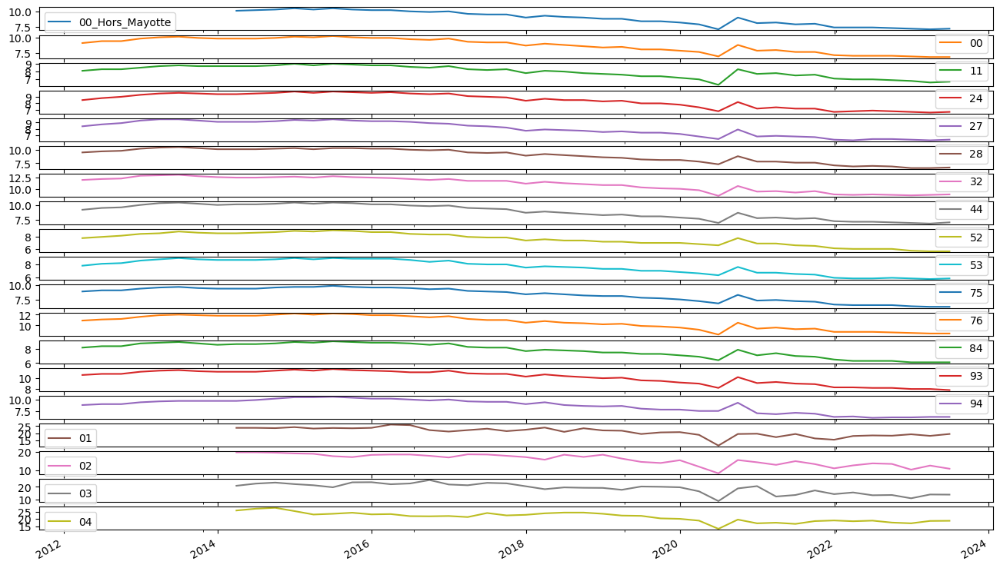

In [ ]:
Donnee_macroeconomique_Chomage_arrange_By_Region.plot(subplots=True, figsize=(16,10))

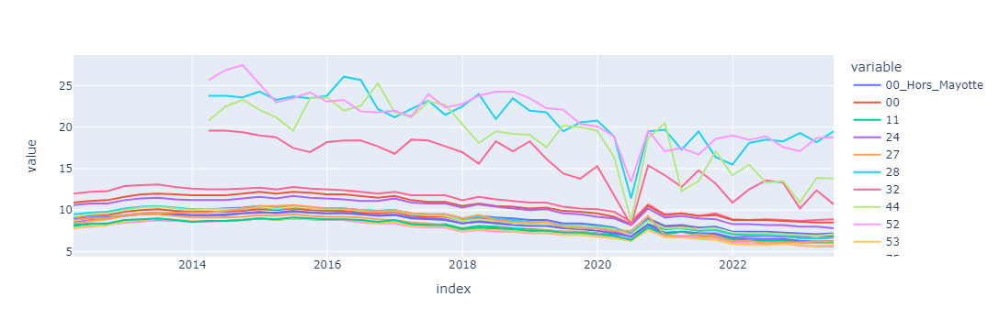

In [20]:
#data = data_Catastrophe_restraint_sorted_by_year_after_2016[data_Catastrophe_restraint_sorted_by_year_after_2016["Code Région"] == j]
#data_group_By_Région = data.groupby("annees").sum()
#data_group_By_Région.reset_index(inplace = True)
px.line(Donnee_macroeconomique_Chomage_arrange_By_Region)

#### de manière generale l'on peut dire que l'on a une tendance baissière pour le taux de chomage dans tout les régions de france. Cependant la période de covid a marqué un forte rémaniement dans l'évolution du taux de chomage.  cella laisse à croire que la france applique une politique progressive de réduction du taux de chomage depuis des année et cette poolitique a été accélerer durant la période covid et ensuite rédréssé très rapidement au 3trimestre de 2020.

In [95]:
Donnee_macroeconomique_PIB_En_Valeur.head(2)

,Année,Code,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
0,Région,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Auvergne-Rhône-Alpes,84,237011.610652,239910.854525,243946.541047,249918.316936,255859.686146,264324.557967,274209.05379,282293.682005,270449.777808,290876.898206


In [96]:
Donnee_macroeconomique_PIB_En_Valeur_arrange = Donnee_macroeconomique_PIB_En_Valeur[Donnee_macroeconomique_PIB_En_Valeur.index>0]
Donnee_macroeconomique_PIB_En_Valeur_arrange = Donnee_macroeconomique_PIB_En_Valeur_arrange[Donnee_macroeconomique_PIB_En_Valeur_arrange.index<23]

In [97]:
Donnee_macroeconomique_PIB_En_Valeur_arrange.drop(columns = "Année", inplace = True)

In [98]:
Donnee_macroeconomique_PIB_En_Valeur_arrange.head(2)

,Code,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
1,84,237011.610652,239910.854525,243946.541047,249918.316936,255859.686146,264324.557967,274209.053790,282293.682005,270449.777808,290876.898206
2,27,71866.966370,72173.051439,73480.009587,74356.897837,74459.481112,76854.904446,78176.348019,79583.809451,76921.584260,81711.618131


In [99]:
Donnee_macroeconomique_PIB_En_Valeur_arrange_By_Region = Donnee_macroeconomique_PIB_En_Valeur_arrange.set_index("Code")
Donnee_macroeconomique_PIB_En_Valeur_arrange_By_Region_transposee = Donnee_macroeconomique_PIB_En_Valeur_arrange_By_Region.T                                           

In [100]:
Donnee_macroeconomique_PIB_En_Valeur_arrange_By_Region_transposee.head(2)

Code,84,27,53,24,94,44,32,11,28,75,...,93,France métropolitaine hors Île-de-France,France métropolitaine,1,2,3,4,Mayotte,Dom,France métropolitaine et DOM
2012,237011.610652,71866.966370,85515.591733,68599.913126,8091.391734,147184.997310,150903.329331,630604.725397,90193.150933,156841.86155,...,150183.603256,1.418477e+06,2.049081e+06,8223.775,8247.486,3782.623,16381.329246,1582.527010,38217.740256,2.087299e+06
2013,239910.854525,72173.051439,86911.435694,69089.013262,8217.324884,148870.280017,152542.691988,644681.134288,91053.323430,157866.51026,...,149878.653284,1.432390e+06,2.077071e+06,8246.477,8274.724,3855.995,16528.234409,1701.938521,38607.368930,2.115678e+06


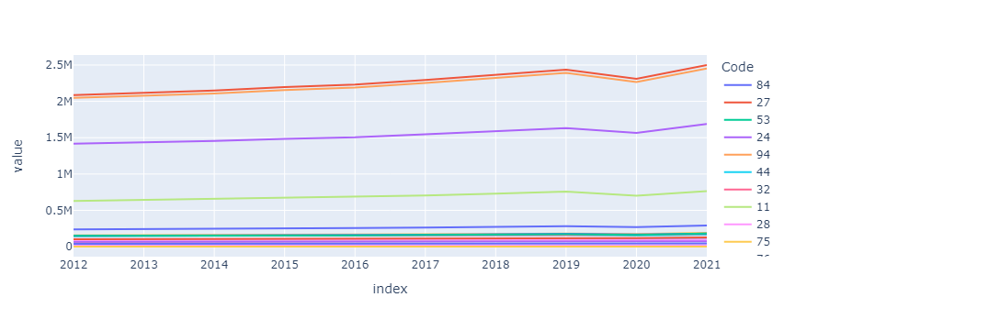

In [101]:
px.line(Donnee_macroeconomique_PIB_En_Valeur_arrange_By_Region_transposee)

#### de la meme manière que l'on observe une décroissance dans le taux de chomage on a une croissance dans le PIB qui illustre probablement également une politique adopté fort logntemps. cependant l'on constate que entre 2019 et 2021 cette politique à du être fortement ajusté pour faire face au différent alléa. dans ce cadre  l'on peut se dire que l'on peut considéré uniquement la période 2016-2021 comme cycle économique et y éffectuer notre étude.

In [102]:
#etude du PIB en volume
Donnee_macroeconomique__PIB_En_Volume.head(2)

,Unnamed: 0,Code,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
0,Région,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Auvergne-Rhône-Alpes,84,240234.962342,241297.657312,243946.541047,247069.19724,251617.056812,258603.298251,265660.255294,270024.990213,251639.251239,267045.235766


In [103]:
Donnee_macroeconomique__PIB_En_Volume_arrange = Donnee_macroeconomique__PIB_En_Volume[Donnee_macroeconomique__PIB_En_Volume.index>0]
Donnee_macroeconomique__PIB_En_Volume_arrange = Donnee_macroeconomique__PIB_En_Volume_arrange[Donnee_macroeconomique__PIB_En_Volume_arrange.index<23]

In [104]:
Donnee_macroeconomique__PIB_En_Volume_arrange.drop(columns = "Unnamed: 0", inplace = True)

In [105]:
Donnee_macroeconomique__PIB_En_Volume_arrange_By_Region = Donnee_macroeconomique__PIB_En_Volume_arrange.set_index("Code")
Donnee_macroeconomique__PIB_En_Volume_arrange_By_Region_transposee = Donnee_macroeconomique__PIB_En_Volume_arrange_By_Region.T                                           

In [106]:
Donnee_macroeconomique__PIB_En_Volume_arrange_By_Region_transposee.head(2)

Code,84,27,53,24,94,44,32,11,28,75,...,93,France métropolitaine hors Île-de-France,France métropolitaine,1,2,3,4,Mayotte,Dom,France métropolitaine et DOM
2012,240234.962342,72844.355229,86678.601538,69532.870146,8201.434450,149186.709414,152955.610653,639180.933128,91419.775420,158974.906755,...,152226.096323,1.437768e+06,2.076949e+06,8296.115555,8414.973418,3911.617357,16501.836335,1604.041985,38728.58465,2.115678e+06
2013,241297.657312,72590.247189,87413.826557,69488.381754,8264.825065,149730.823487,153424.463806,648407.708460,91579.656442,158779.056368,...,150745.025648,1.440670e+06,2.089077e+06,8271.343192,8325.941467,3998.312999,16501.563313,1711.757919,38808.91889,2.127886e+06


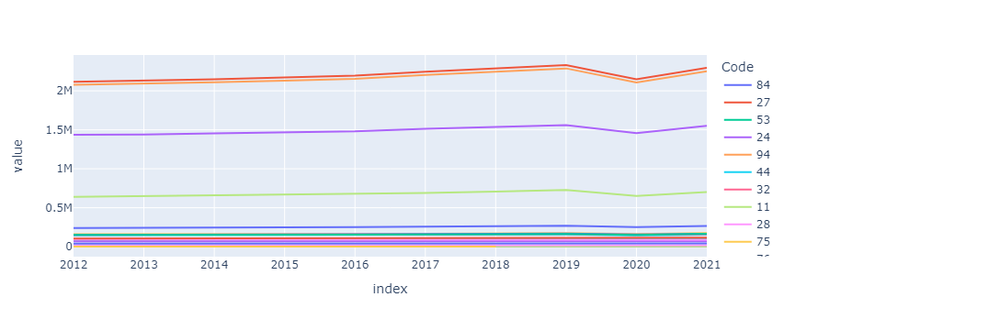

In [45]:
px.line(Donnee_macroeconomique__PIB_En_Volume_arrange_By_Region_transposee)

In [115]:
inflation_implicite = (Donnee_macroeconomique_PIB_En_Valeur_arrange_By_Region_transposee.astype(int)-Donnee_macroeconomique__PIB_En_Volume_arrange_By_Region_transposee.astype(int))/Donnee_macroeconomique__PIB_En_Volume_arrange_By_Region_transposee.astype(int)

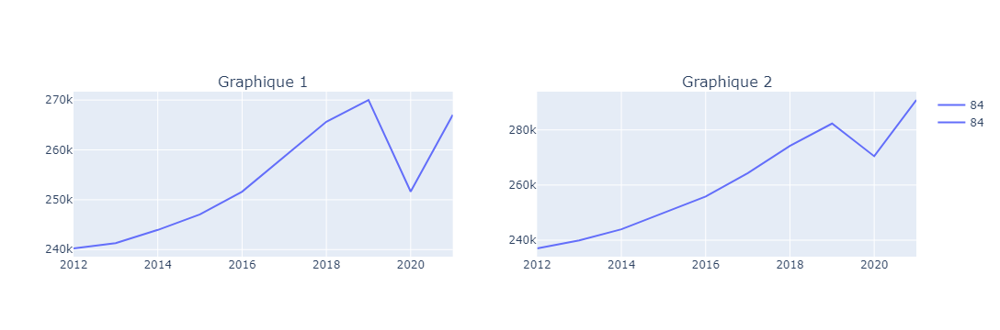

In [44]:
import plotly.express as px
from plotly.subplots import make_subplots
fig1 = px.line(Donnee_macroeconomique__PIB_En_Volume_arrange_By_Region_transposee, title='PIB_En_Volume')
fig2 = px.line(Donnee_macroeconomique_PIB_En_Valeur_arrange_By_Region_transposee, title='PIB_En_Valeur')

combined_fig = make_subplots(rows=1, cols=2, subplot_titles=('PIB_En_Volume', 'PIB_En_Valeur'))

combined_fig.add_trace(fig1.data[0], row=1, col=1)
combined_fig.add_trace(fig2.data[0], row=1, col=2)
combined_fig.show()


#### le PIB en volume est nettement inférieur au PIB en valeur ce qui est normal car le PIB en volume tien compte de l'effet de l'inflation ce qui n'est pas le cas du PIB en Valeur encore appélé PIB Nominal. 

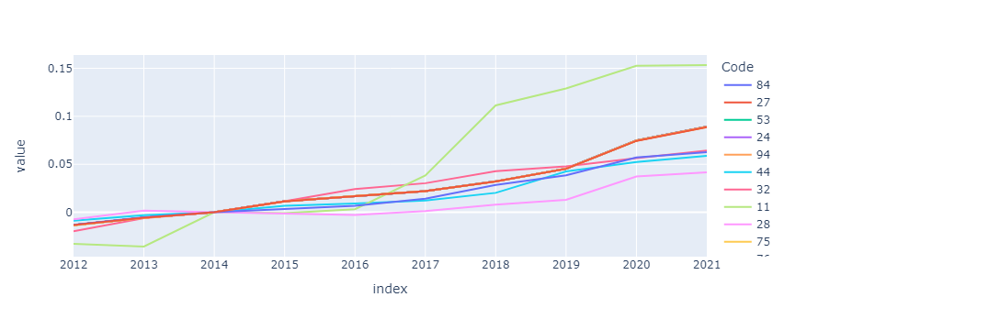

In [117]:
px.line(inflation_implicite)

#### l'inflation est en forte croissance de manière génerale. en utilisant l'inflation implicite. sachant que cela ne réflète pas le vrai taux d'inflation.

In [139]:
Donnee_macroeconomique_PIB_par_Hab.head(2)

,Année,Code,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
0,Région,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Auvergne-Rhône-Alpes,84,30675.438202,30800.130323,31078.637144,31646.071776,32254.251216,33159.225891,34210.379363,35034.651634,33418.34479,35765.29


In [162]:
Donnee_macroeconomique_PIB_par_Hab_arrange = Donnee_macroeconomique_PIB_par_Hab[Donnee_macroeconomique_PIB_par_Hab.index>0]
Donnee_macroeconomique_PIB_par_Hab_arrange = Donnee_macroeconomique_PIB_par_Hab_arrange[Donnee_macroeconomique_PIB_par_Hab_arrange.index<23]

In [163]:
Donnee_macroeconomique_PIB_par_Hab_arrange.drop(columns = "Année", inplace = True)
Donnee_macroeconomique_PIB_par_Hab_arrange.drop(columns = 2012, inplace = True)
Donnee_macroeconomique_PIB_par_Hab_arrange.drop(columns = 2013, inplace = True)

In [164]:
Donnee_macroeconomique_PIB_par_Hab_arrange.head(2)

,Code,2014,2015,2016,2017,2018,2019,2020,2021
1,84,31078.637144,31646.071776,32254.251216,33159.225891,34210.379363,35034.651634,33418.344790,35765.29
2,27,26049.521945,26371.070139,26452.093122,27354.247627,27865.081641,28397.319492,27497.549123,29257.79


In [165]:
Donnee_macroeconomique_PIB_par_Hab_arrange_By_Region = Donnee_macroeconomique_PIB_par_Hab_arrange.set_index("Code")
Donnee_macroeconomique_PIB_par_Hab_arrange_By_Region = Donnee_macroeconomique_PIB_par_Hab_arrange_By_Region.T

In [166]:
Donnee_macroeconomique_PIB_par_Hab_arrange_By_Region.head(2)

Code,84,27,53,24,94,44,32,11,28,75,...,93,France métropolitaine hors Île-de-France,France métropolitaine,1,2,3,4,Mayotte,Dom,France métropolitaine et DOM
2014,31078.637144,26049.521945,27083.337826,26947.769824,25611.927517,27082.079883,25619.892048,54249.432411,27356.931780,27318.579061,...,30426.912734,27913.909386,32861.683388,21087.512027,22244.412831,15480.018664,20045.366160,8137.347823,18801.769193,32413.584590
2015,31646.071776,26371.070139,27666.261234,27433.417180,26203.258843,27383.888492,26204.913023,55424.731128,27888.049167,27731.552156,...,30913.054780,28409.511930,33486.398707,21647.572276,22902.021108,15091.484212,20608.290078,8789.156677,19209.693524,33029.683946


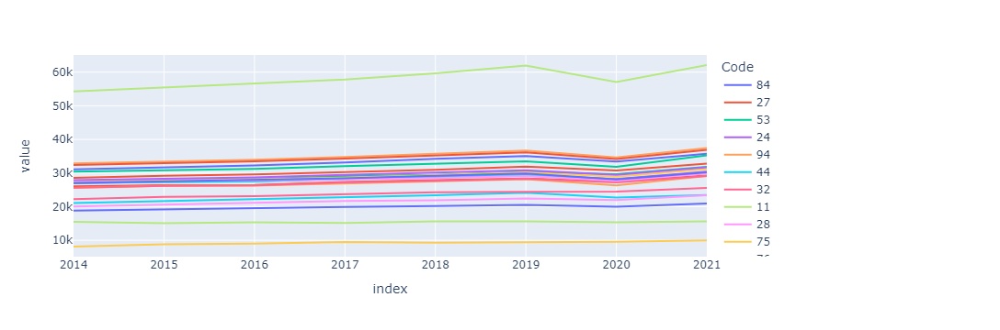

In [167]:
px.line(Donnee_macroeconomique_PIB_par_Hab_arrange_By_Region.astype(float))

#### Comme on s'y attendait. L'on une conservation de la shape as le PIB en valeur est en principe égale au PIB par habitant multiplié par le population active

In [178]:
Donnee_macroeconomique_PIB_par_Emploi.head(2)

,Année,Code,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
0,Région,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Auvergne-Rhône-Alpes,84,72853.168605,72885.45426,74029.527578,75507.148464,76649.079481,77815.663773,78851.536951,80747.187088,75823.363111,79729.75


In [179]:
Donnee_macroeconomique_PIB_par_Emploi_arrange = Donnee_macroeconomique_PIB_par_Emploi[Donnee_macroeconomique_PIB_par_Emploi.index>0]
Donnee_macroeconomique_PIB_par_Emploi_arrange = Donnee_macroeconomique_PIB_par_Emploi_arrange[Donnee_macroeconomique_PIB_par_Emploi_arrange.index<23]

In [180]:
Donnee_macroeconomique_PIB_par_Emploi_arrange.drop(columns = "Année", inplace = True)
Donnee_macroeconomique_PIB_par_Emploi_arrange.drop(columns = 2012, inplace = True)

In [181]:
Donnee_macroeconomique_PIB_par_Emploi_arrange.head(2)

,Code,2013,2014,2015,2016,2017,2018,2019,2020,2021
1,84,72885.454260,74029.527578,75507.148464,76649.079481,77815.663773,78851.536951,80747.187088,75823.363111,79729.75
2,27,66222.253516,67945.256905,68853.697232,68793.319363,70282.377621,71447.489016,72722.098500,69714.030265,73262.25


In [182]:
Donnee_macroeconomique_PIB_par_Emploi_arrange_By_Region = Donnee_macroeconomique_PIB_par_Emploi_arrange.set_index("Code")
Donnee_macroeconomique_PIB_par_Emploi_arrange_By_Region = Donnee_macroeconomique_PIB_par_Emploi_arrange_By_Region.T

In [183]:
Donnee_macroeconomique_PIB_par_Emploi_arrange_By_Region.head(2)

Code,84,27,53,24,94,44,32,11,28,75,...,93,France métropolitaine hors Île-de-France,France métropolitaine,1,2,3,4,Mayotte,Dom,France métropolitaine et DOM
2013,72885.454260,66222.253516,66216.773644,68963.568531,67385.500706,69909.906702,69861.036964,105322.638526,70910.876288,67498.300538,...,73859.828321,69833.599805,77990.136764,64223.898382,62853.961261,70819.772994,60818.336531,42397.713718,61633.118336,77614.254311
2014,74029.527578,67945.256905,67638.527660,69708.514223,67996.946615,71058.351808,70636.350483,106604.305260,71283.726462,68933.307315,...,74822.660707,70973.716403,79181.908653,65832.574549,64420.369431,71411.052670,60670.690300,42885.646942,62208.889766,78784.524698


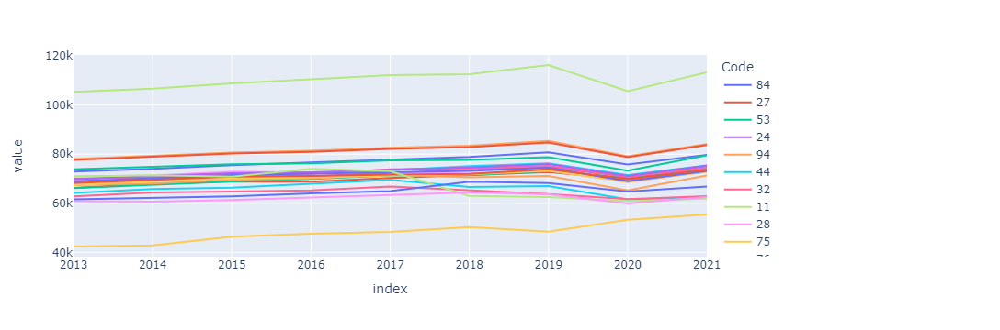

In [184]:
px.line(Donnee_macroeconomique_PIB_par_Emploi_arrange_By_Region.astype(float))

#### Encore la meme shape

### Etude des créations d'entreprise

In [186]:
Donnee_de_creation = pd.read_csv("TABLE_CREATION_2017_2023.csv")

In [188]:
Donnee_de_creation.head(2)

,Secteur,trimestre,code_region,code_dep,nombre_creation
0,Activites de services administratifs et de sou...,12017,1,971,279
1,Activites de services administratifs et de sou...,12017,2,972,638


In [187]:
#Fonction de traitement des trimestres
def TraitementTrim(trim):
    trimesttre = int(str(trim)[0])*12/4
    annee=str(trim)[1:]
    trime_datetime=datetime.datetime(int(annee),int(trimesttre),1)
    return trime_datetime

In [189]:
Donnee_de_creation["trimestre"] = Donnee_de_creation["trimestre"].apply(TraitementTrim)

In [192]:
Donnee_de_creation.head(2)

,Secteur,trimestre,code_region,code_dep,nombre_creation
0,Activites de services administratifs et de sou...,2017-03-01,1,971,279
1,Activites de services administratifs et de sou...,2017-03-01,2,972,638


In [194]:
Donnee_de_creation_filt_By_Region = Donnee_de_creation.drop(["Secteur","code_dep"], axis = 1)

In [195]:
Donnee_de_creation_filt_By_Region.head(2)

,trimestre,code_region,nombre_creation
0,2017-03-01,1,279
1,2017-03-01,2,638


#### évolution des création d'entreprise En france 

In [199]:
Donnee_de_creation_filt_By_All_France = Donnee_de_creation_filt_By_Region.groupby("trimestre").sum()
Donnee_de_creation_filt_By_All_France = Donnee_de_creation_filt_By_All_France.drop("code_region", axis = 1)

In [200]:
Donnee_de_creation_filt_By_All_France.head(2)

,nombre_creation
trimestre,
2017-03-01,219492
2017-06-01,187732


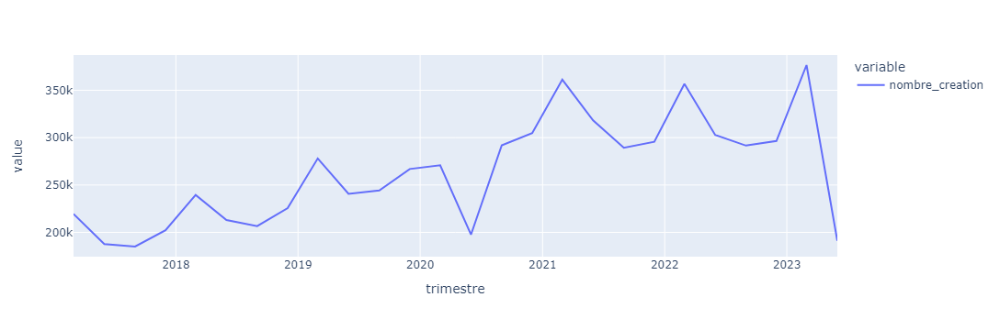

In [201]:
px.line(Donnee_de_creation_filt_By_All_France)

In [207]:
#affiche par année avant de passé à l'étude de l'économie
liste =  set(Donnee_de_creation_filt_By_Region["code_region"])
num_subplots = len(liste)  # Change this number as needed
fig, axs = plt.subplots(num_subplots, 1, figsize=(5*num_subplots, 200))
for i, j in enumerate(liste):
    data = Donnee_de_creation_filt_By_Region[Donnee_de_creation_filt_By_Region["code_region"] == j]
    data_group_By_Région = data.groupby("trimestre").sum()
    data_group_By_Région.reset_index(inplace = True)
    axs[i].plot(data_group_By_Région["trimestre"], data_group_By_Région["nombre_creation"], label=f'Subplot{j}')
    axs[i].set_title(f'Subplot {j}')


plt.tight_layout()
plt.show()

In [208]:
Donnee_de_défaillance = pd.read_csv("TABLE_DEFAUT_2017_2023.csv")

In [209]:
Donnee_de_défaillance.head(2)

,Secteur,trimestre,code_region,code_dep,nombre_defaut
0,Activites de services administratifs et de sou...,12017,1.0,971,4
1,Activites de services administratifs et de sou...,12017,2.0,972,8


In [210]:
Donnee_de_défaillance["trimestre"] = Donnee_de_défaillance["trimestre"].apply(TraitementTrim)

In [211]:
Donnee_de_défaillance.head(2)

,Secteur,trimestre,code_region,code_dep,nombre_defaut
0,Activites de services administratifs et de sou...,2017-03-01,1.0,971,4
1,Activites de services administratifs et de sou...,2017-03-01,2.0,972,8


In [212]:
Donnee_de_défaillance_filt_By_Region = Donnee_de_défaillance.drop(["Secteur","code_dep"], axis = 1)

In [213]:
Donnee_de_défaillance_filt_By_Region.head(1)

,trimestre,code_region,nombre_defaut
0,2017-03-01,1.0,4


#### évolution des défaillances dans toutes la France

In [214]:
Donnee_de_défaillance_filt_By_All_France = Donnee_de_défaillance_filt_By_Region.groupby("trimestre").sum()
Donnee_de_défaillance_filt_By_All_France = Donnee_de_défaillance_filt_By_All_France.drop("code_region", axis = 1)

In [215]:
Donnee_de_défaillance_filt_By_All_France.head(1)

,nombre_defaut
trimestre,
2017-03-01,14903


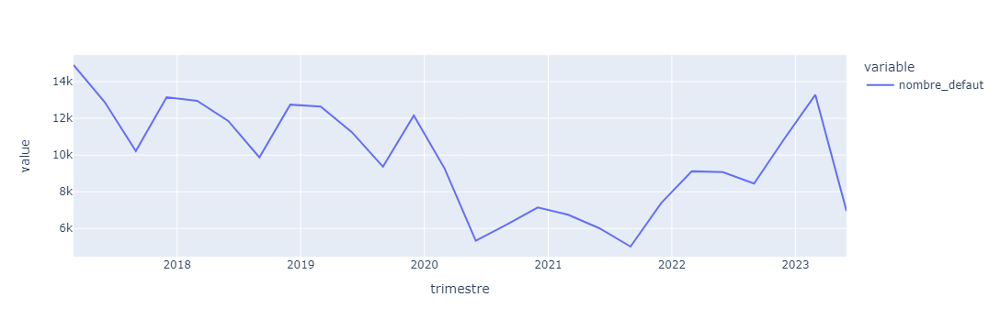

In [216]:
px.line(Donnee_de_défaillance_filt_By_All_France)

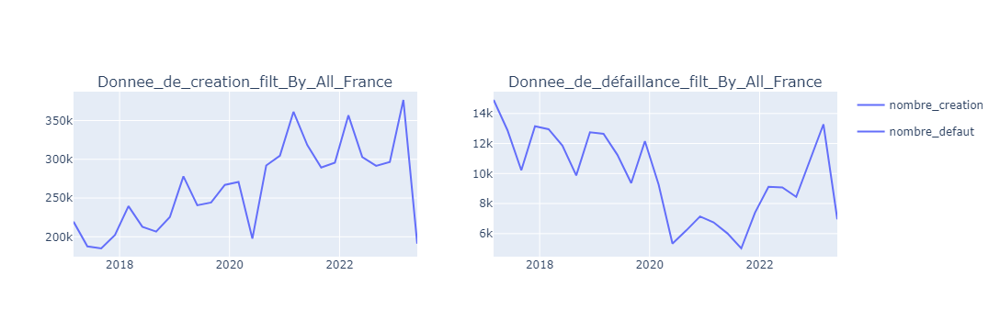

In [217]:
fig1 = px.line(Donnee_de_creation_filt_By_All_France, title='Donnee_de_creation_filt_By_All_France')
fig2 = px.line(Donnee_de_défaillance_filt_By_All_France, title='Donnee_de_défaillance_filt_By_All_France')

combined_fig = make_subplots(rows=1, cols=2, subplot_titles=('Donnee_de_creation_filt_By_All_France', 'Donnee_de_défaillance_filt_By_All_France'))

combined_fig.add_trace(fig1.data[0], row=1, col=1)
combined_fig.add_trace(fig2.data[0], row=1, col=2)
combined_fig.show()

In [219]:
Donnee_de_creation_filt_By_All_France

,nombre_creation
trimestre,
2017-03-01,219492
2017-06-01,187732
2017-09-01,185023
2017-12-01,202223
2018-03-01,239575
2018-06-01,212992
2018-09-01,206688
2018-12-01,225586
2019-03-01,278058
